In [ ]:
!wget https://courses.edx.org/assets/courseware/v1/ded9e59839c77f4037c800dcade5bd58/asset-v1:MITx+6.419x+2T2023+type@asset+block/release_gp_homework_data.tar.gz -P /content

--2024-07-22 15:45:20--  https://courses.edx.org/assets/courseware/v1/ded9e59839c77f4037c800dcade5bd58/asset-v1:MITx+6.419x+2T2023+type@asset+block/release_gp_homework_data.tar.gz
Resolving courses.edx.org (courses.edx.org)... 104.16.190.80, 104.16.192.80, 104.16.189.80, ...
Connecting to courses.edx.org (courses.edx.org)|104.16.190.80|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 151489421 (144M) [application/x-tar]
Saving to: ‘/content/release_gp_homework_data.tar.gz’

release_gp_homework 100%[===================>] 144.47M  49.5MB/s    in 2.9s    

2024-07-22 15:45:23 (49.5 MB/s) - ‘/content/release_gp_homework_data.tar.gz’ saved [151489421/151489421]



In [ ]:
!gunzip release_gp_homework_data.tar.gz
!tar -xvf release_gp_homework_data.tar

./._OceanFlow
OceanFlow/
OceanFlow/._100u.csv
OceanFlow/100u.csv
OceanFlow/._100v.csv
OceanFlow/100v.csv
OceanFlow/._10u.csv
OceanFlow/10u.csv
OceanFlow/._10v.csv
OceanFlow/10v.csv
OceanFlow/._11u.csv
OceanFlow/11u.csv
OceanFlow/._11v.csv
OceanFlow/11v.csv
OceanFlow/._12u.csv
OceanFlow/12u.csv
OceanFlow/._12v.csv
OceanFlow/12v.csv
OceanFlow/._13u.csv
OceanFlow/13u.csv
OceanFlow/._13v.csv
OceanFlow/13v.csv
OceanFlow/._14u.csv
OceanFlow/14u.csv
OceanFlow/._14v.csv
OceanFlow/14v.csv
OceanFlow/._15u.csv
OceanFlow/15u.csv
OceanFlow/._15v.csv
OceanFlow/15v.csv
OceanFlow/._16u.csv
OceanFlow/16u.csv
OceanFlow/._16v.csv
OceanFlow/16v.csv
OceanFlow/._17u.csv
OceanFlow/17u.csv
OceanFlow/._17v.csv
OceanFlow/17v.csv
OceanFlow/._18u.csv
OceanFlow/18u.csv
OceanFlow/._18v.csv
OceanFlow/18v.csv
OceanFlow/._19u.csv
OceanFlow/19u.csv
OceanFlow/._19v.csv
OceanFlow/19v.csv
OceanFlow/._1u.csv
OceanFlow/1u.csv
OceanFlow/._1v.csv
OceanFlow/1v.csv
OceanFlow/._20u.csv
OceanFlow/20u.csv
OceanFlow/._20v.csv
Ocean

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

## Loading Data

In [ ]:
# prompt: read 100 csv files with pandas in order from 1 to 100 and with the format {number}{u}.csv. Also there is two types of .csv files: u and v. I want to stack for exmaple 1u and 1v and then stack the 100 files to a new dimention

arys = []

for i in range(1, 101):
    filename_u = f"OceanFlow/{i}u.csv"
    filename_v = f"OceanFlow/{i}v.csv"
    h = pd.read_csv(filename_u, header=None).to_numpy().T
    v = pd.read_csv(filename_v, header=None).to_numpy().T

    arys.append(np.transpose(np.array([h,v], dtype=np.float32), [1,2,0]))

data = np.array(arys)

data.shape



(100, 555, 504, 2)

In [ ]:
mask = pd.read_csv("OceanFlow/mask.csv", header=None).to_numpy().T
mask

array([[1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       ...,
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1],
       [1, 1, 1, ..., 1, 1, 1]])

## Compute the Velocities using euclidean norm

In [ ]:
velocities_per_time = np.linalg.norm(data, axis=3)

velocities_per_time.shape

(100, 555, 504)

## Compute variance across time

In [ ]:
variance_in_time = np.var(velocities_per_time, axis=0)


## Smallest Variance  but bigger than cero

In [ ]:
# prompt: find the indeces of the smallest variance on the variance_in_time matrix but bigger than cero

# Get the indices of the smallest variance values that are greater than zero.
smallest_variance_indices = np.where(np.logical_and(variance_in_time > 0, variance_in_time == np.min(variance_in_time[variance_in_time > 0])))

# Print the indices.
print((smallest_variance_indices*np.array([3])))


[[510]
 [363]]


## Maximus x-axis velocity

In [ ]:
# prompt: I can get the maximun value for the x-axis whit this code: new_dim[:, 0,:,:].max(). But, how can I know in which of the 100 times occurs and the indeces?

max_value = data[:, :,:,0].max()
max_indices = np.where(data[:, :,:,0] == max_value)

print("Maximum x-axis velocity:", max_value)
print("Time index:", max_indices[0][0]*np.array([3]))
print("y index:", max_indices[1][0]*np.array([3]))
print("z index:", max_indices[2][0]*np.array([3]))


Maximum x-axis velocity: 5.7993
Time index: [84]
y index: [1041]
z index: [543]


## Average over all x-axis and y-axis

In [ ]:
np.mean(data, axis=(0,1,2))

array([-0.09359308, -0.03547521], dtype=float32)

## Identify long-correlation areas


<ipython-input-11-3fc823c8d8f6>:12: RuntimeWarning: invalid value encountered in divide
  corrs = (d_delta[:,ps[:,0,0],ps[:,0,1]]*d_delta[:,ps[:,1,0],ps[:,1,1]]).mean(axis=0)/div


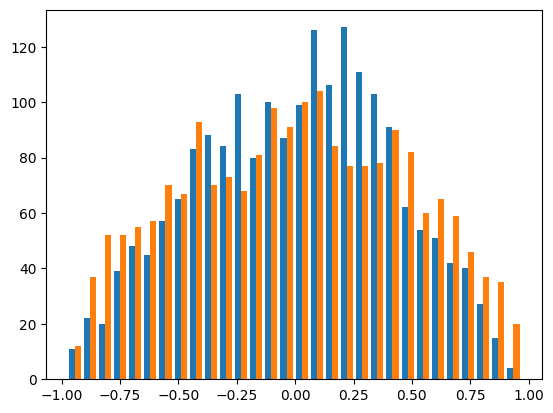

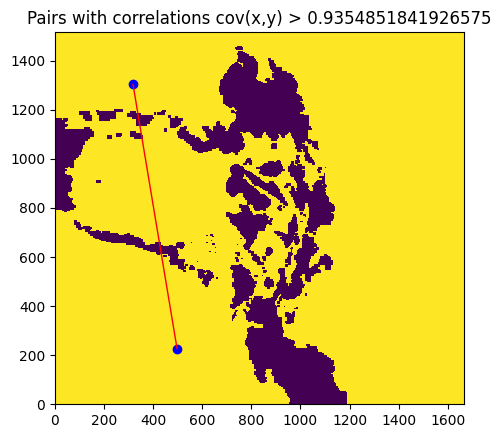

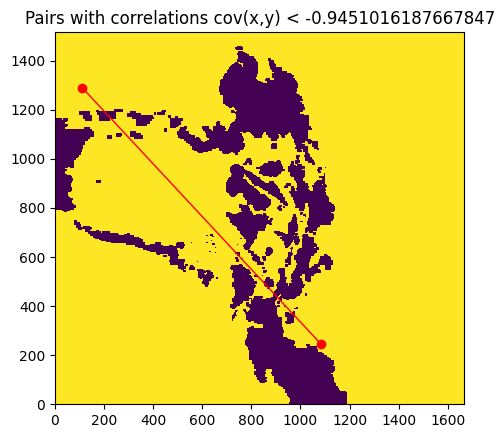

In [ ]:
def get_correlated_pairs(d, num_pairs, dist_threshold, mag_threshold=None):
  pairs = np.array([ np.random.randint(0, data.shape[1], size=[2, num_pairs]), np.random.randint(0, data.shape[2], size=[2, num_pairs]) ]).transpose([2, 1, 0])
  idx_dist_threshold = dist_threshold/3.0
  pairs_dists = np.sqrt(np.square(pairs[:,0,:] - pairs[:, 1, :]).sum(axis=1))
  ps = pairs[pairs_dists > idx_dist_threshold, :, :]

  moment = lambda a: np.sqrt(np.square(a).mean(axis=0))
  if mag_threshold:
    ps = ps[(moment(d[:,ps[:,0,0],ps[:,0,1]]) * moment(d[:,ps[:,1,0],ps[:,1,1]])).min(axis=1) > mag_threshold]
  d_delta = (d - d.mean(axis=0)[None, :, :, :])
  div = ( moment(d_delta[:,ps[:,0,0],ps[:,0,1]]) * moment(d_delta[:,ps[:,1,0],ps[:,1,1]]) )
  corrs = (d_delta[:,ps[:,0,0],ps[:,0,1]]*d_delta[:,ps[:,1,0],ps[:,1,1]]).mean(axis=0)/div
  return ps[div.min(axis=1)>0], corrs[div.min(axis=1)>0]



import matplotlib.pyplot as plt
import matplotlib
plt.hist(get_correlated_pairs(data, 50000, 1500.0)[1], bins=30)
plt.show()

def plot_correlated_pairs(pairs, covs, cov_threshold, negative=False):
  covs, cov_cut = (-covs, -cov_threshold) if negative else (covs, cov_threshold)
  plot_pairs = pairs[np.all(covs >= cov_cut, axis=1)]

  x_extent, y_extent = 3*(data.shape[1]+1), 3*(data.shape[2]+1)
  plt.matshow(mask.T, origin='lower', extent=[0, x_extent, 0, y_extent])
  plt.axis([0, x_extent, 0, y_extent])
  plt.title("Pairs with correlations cov(x,y) {} {}".format("<" if negative else ">", cov_threshold))

  cmap = plt.get_cmap('hsv')
  lc = matplotlib.collections.LineCollection(plot_pairs*3, colors=cmap(np.linspace(0, 1, plot_pairs.shape[0]+1))[:-1], linewidths=1)
  plt.gca().add_collection(lc)
  plt.scatter(*plot_pairs.reshape((-1, 2)).T*3, c='r' if negative else 'b', marker='o')
  plt.gca().xaxis.tick_bottom()
  plt.show()

p2_pairs, p2_corrs = get_correlated_pairs(data, 1000000, 1000.0)
plot_correlated_pairs(p2_pairs, p2_corrs, p2_corrs.min(axis=1).max(axis=0))
plot_correlated_pairs(p2_pairs, p2_corrs, p2_corrs.max(axis=1).min(axis=0), negative=True)

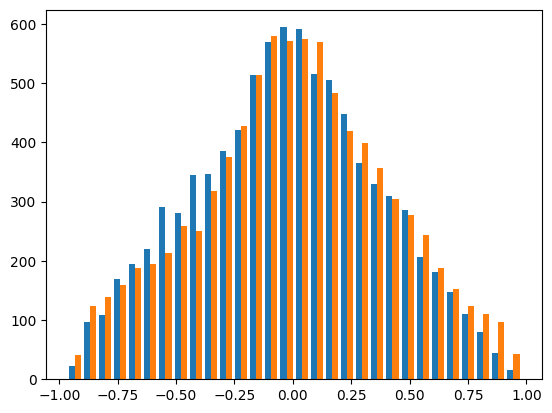

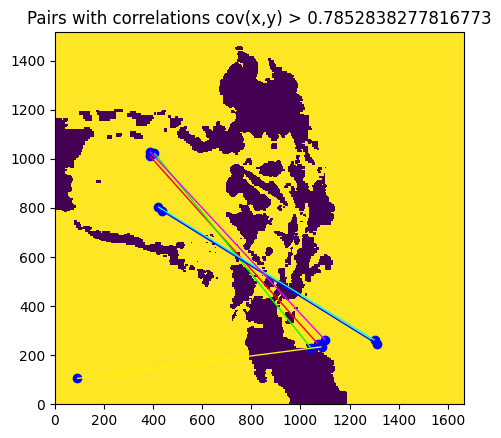

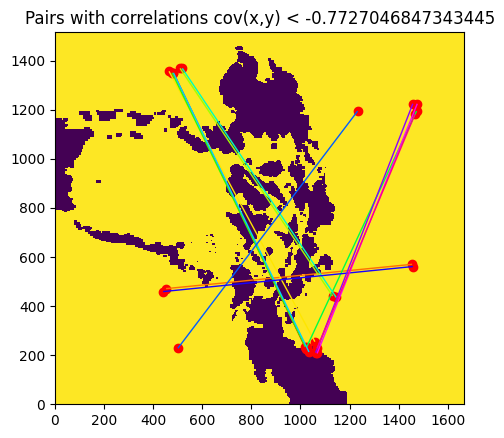

In [ ]:
p2_pairs, p2_corrs = get_correlated_pairs(data, 2000000, 1000.0, mag_threshold=0.3)
plt.hist(p2_corrs, bins=30)
plt.show()
plot_correlated_pairs(p2_pairs, p2_corrs, p2_corrs.min(axis=1).max(axis=0)-0.1)
plot_correlated_pairs(p2_pairs, p2_corrs, p2_corrs.max(axis=1).min(axis=0)+0.1, negative=True)

## Simulation with JAX

### Animation with matplotlib

In [ ]:
import matplotlib.pyplot as plt
plt.rcParams["figure.figsize"] = (8,8)

def flowplot(ax, grid_x, grid_y, title, overlay=None, grid_stride=1, density=False):

  sc_cmap = plt.get_cmap('cool')
  sc = ax.scatter(0, 0, marker='o')
  ax.set_xlabel(r"$x$-axis")
  ax.set_ylabel(r"$y$-axis")
  ax.set_title(title)

  qv = ax.quiver(grid_x[::grid_stride,::grid_stride], grid_y[::grid_stride,::grid_stride],
                 np.ones_like(grid_x[::grid_stride,::grid_stride]), np.ones_like(grid_y[::grid_stride,::grid_stride]))

  if overlay:
    overlay(ax)

  def update(new_loc, new_fl = None, new_title=None):
    sc.set_offsets(new_loc)
    if density:
      from scipy.stats import gaussian_kde
      estimate_points = new_loc[np.all([new_loc[:,0]>grid_x[3,0],
                                        new_loc[:,0]<grid_x[-3,0],
                                        new_loc[:,1]>grid_y[0,3],
                                        new_loc[:,1]<grid_y[0,-3]], axis=0) ]
      cs = gaussian_kde(estimate_points.T)(new_loc.T)
      sc.set_facecolors(sc_cmap((cs-cs.min())/cs.max()))
    if new_title:
      ax.set_title(new_title)
    if new_fl:
      qv.set_UVC(new_fl[0][::grid_stride,::grid_stride], new_fl[1][::grid_stride,::grid_stride])
      return sc, qv
    else:
      return sc,

  return update

import matplotlib.animation as anim

def animate(state, g_x, g_y, title, overlay=None, grid_stride=1, density=False):
  fig, ax = plt.subplots()
  update_plot = flowplot(ax,
                         g_x, g_y,
                         title.format(0),
                         overlay,
                         grid_stride,
                         density)

  def frame(s):
    x, t, v, fl_x, fl_y = s
    return update_plot(x,
                      new_fl = (fl_x, fl_y),
                      new_title=title.format(t))

  animation = anim.FuncAnimation(fig, frame, frames=state, blit=True)
  plt.close()
  return animation


### Acceleration with JAX

In [ ]:
!pip install -U jax

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 14.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.6/79.6 MB 8.4 MB/s eta 0:00:00
  Attempting uninstall: jaxlib
    Found existing installation: jaxlib 0.4.26+cuda12.cudnn89
    Uninstalling jaxlib-0.4.26+cuda12.cudnn89:
      Successfully uninstalled jaxlib-0.4.26+cuda12.cudnn89
  Attempting uninstall: jax
    Found existing installation: jax 0.4.26
    Uninstalling jax-0.4.26:
      Successfully uninstalled jax-0.4.26


In [ ]:
from jax import config
config.update("jax_enable_x64", True)
import jax.numpy as jnp
import jax
import functools


@functools.partial(jax.jit, static_argnums=(0,1))
def jax_sim(N, save_stride, t_edges, g_x_edges, g_y_edges, v_grid, x_0, epsilon):

  clamp = lambda ar, min_, max_: jnp.maximum(min_, jnp.minimum(max_, ar))

  def get_grid(t):
    vt = clamp(jnp.searchsorted(t_edges, t), 1, t_edges.shape[0]-1)
    return v_grid[vt-1]

  def get_v(grid, x):
    vi = clamp(jnp.searchsorted(g_x_edges, x[:,0]), 1, g_x_edges.shape[0]-1)
    vj = clamp(jnp.searchsorted(g_y_edges, x[:,1]), 1, g_y_edges.shape[0]-1)
    return grid[vi-1,vj-1,:]

  state_0 = (x_0, 0.0, get_v(get_grid(0.0), x_0), *get_grid(0.0).transpose([2,0,1]))

  def step(i, state):
    x, t, v, _, _ = state

    v_t_grid = get_grid(t)
    v = get_v(v_t_grid, x)

    x = x + epsilon*v # Compute the next position value
    t = t + epsilon # Compute the next time

    new_state = (x, t, v, v_t_grid[:,:,0], v_t_grid[:,:,1])
    return new_state

  def save_step(state, i):
    new_state = jax.lax.fori_loop(i, i+save_stride, step, state)
    return new_state, new_state

  _, states = jax.lax.scan(save_step, state_0, xs=jnp.arange(0, N, save_stride))
  return states

In [ ]:
T = 300.0 #@param {type:"number"}
N = 200000 #@param {type:"integer"}
num = 1000 #@param {type:"integer"}
epsilon = T/N # hours

print(f"{T} hours of simulation, \n {N} iterations")

midpoint = lambda ar: (ar[1:] + ar[:-1])/2

grid_t_edges = np.arange(0, data.shape[0]+1)*3 # 3hrs per point
grid_x_edges = np.arange(0, data.shape[1]+1)*3 # 3km per point
grid_y_edges = np.arange(0, data.shape[2]+1)*3 # 3km per point
grid_x, grid_y = np.meshgrid(midpoint(grid_x_edges), midpoint(grid_y_edges), indexing='ij')

x_0 = np.array([ np.random.rand(num)*grid_x_edges.max(), np.random.rand(num)*grid_y_edges.max() ]).T

def plot_overlay(ax):
  ax.matshow(mask.T, extent=[0, grid_x_edges.max(), 0, grid_y_edges.max()])
  ax.axis([0, grid_x_edges.max(), 0, grid_y_edges.max()])

states = jax_sim(N, N//100, grid_t_edges, grid_x_edges, grid_y_edges, data, x_0, epsilon)



300.0 hours of simulation, 
 200000 iterations


In [ ]:
animation = animate(zip(*states), grid_x, grid_y, "{}", overlay=plot_overlay, grid_stride=20)
import IPython.display
from IPython.display import HTML
HTML(animation.to_html5_video())

<ipython-input-13-835444f3a548>:55: UserWarning: frames=<zip object at 0x7e27dddb0a80> which we can infer the length of, did not pass an explicit *save_count* and passed cache_frame_data=True.  To avoid a possibly unbounded cache, frame data caching has been disabled. To suppress this warning either pass `cache_frame_data=False` or `save_count=MAX_FRAMES`.
  animation = anim.FuncAnimation(fig, frame, frames=state, blit=True)


In [ ]:
for x_0_variance in [10**2, 30**2, 50**2]:
  x_0 = np.random.multivariate_normal(mean=[300, 1050], cov=[[x_0_variance, 0], [0, x_0_variance]], size=num)

  plane_states = jax_sim(N, N//100, grid_t_edges, grid_x_edges, grid_y_edges, data, x_0, epsilon)
  plane_animation = animate(zip(*plane_states), grid_x, grid_y, "{}", overlay=plot_overlay, grid_stride=20, density=True)
  IPython.display.display(HTML(plane_animation.to_html5_video()))

<ipython-input-13-835444f3a548>:55: UserWarning: frames=<zip object at 0x7e27ddeee180> which we can infer the length of, did not pass an explicit *save_count* and passed cache_frame_data=True.  To avoid a possibly unbounded cache, frame data caching has been disabled. To suppress this warning either pass `cache_frame_data=False` or `save_count=MAX_FRAMES`.
  animation = anim.FuncAnimation(fig, frame, frames=state, blit=True)


<ipython-input-13-835444f3a548>:55: UserWarning: frames=<zip object at 0x7e27da30a100> which we can infer the length of, did not pass an explicit *save_count* and passed cache_frame_data=True.  To avoid a possibly unbounded cache, frame data caching has been disabled. To suppress this warning either pass `cache_frame_data=False` or `save_count=MAX_FRAMES`.
  animation = anim.FuncAnimation(fig, frame, frames=state, blit=True)


<ipython-input-13-835444f3a548>:55: UserWarning: frames=<zip object at 0x7e27da280a40> which we can infer the length of, did not pass an explicit *save_count* and passed cache_frame_data=True.  To avoid a possibly unbounded cache, frame data caching has been disabled. To suppress this warning either pass `cache_frame_data=False` or `save_count=MAX_FRAMES`.
  animation = anim.FuncAnimation(fig, frame, frames=state, blit=True)


## Estimating Flows with Gaussian Processes

### Defining the Gaussian Process

In [ ]:
import scipy

def gaussian_process(x0_mean, x1_mean, x1, cov_blocks, tau):
  cov_11_noise = cov_blocks[1][1] + tau * np.eye(x1_mean.shape[0])

  x0_mean_cond1 = x0_mean + cov_blocks[0][1].dot( np.linalg.solve(cov_11_noise, x1 - x1_mean ) )
  cov_00_cond2 = cov_blocks[0][0] - cov_blocks[0][1].dot(np.linalg.solve(cov_11_noise, cov_blocks[0][1].T))

  return x0_mean_cond1, cov_00_cond2



### Defining the Cross-validation

In [ ]:
def cross_validate(K, values, means, cov, tau):
  perm = np.random.permutation(values.shape[0])
  folds = list(map(np.sort, np.array_split(perm, K)))

  def validate(i):
    test = folds[i]
    train = np.array(sorted(list(set(perm) - set(test))))

    cov_blocks = [
                  [ cov[test[:,None],  test], cov[test[:,None],  train] ],
                  [ cov[train[:,None], test], cov[train[:,None], train] ]
    ]

    x0_mean_cond1, cov_00_cond2 = gaussian_process(means[test], means[train], values[train], cov_blocks, tau)

    try:
      return scipy.stats.multivariate_normal.logpdf(values[test], mean=x0_mean_cond1, cov=cov_00_cond2+1E-10 * np.eye(cov_00_cond2.shape[0]))
    except:
      # Some diagnostics in case of problems
      print(np.linalg.eigvals(cov_00_cond2))
      print(np.linalg.eigvals(cov_00_cond2+1E-7 * np.eye(cov_00_cond2.shape[0])))
      print((cov_00_cond2-cov_00_cond2.T).max()/cov_00_cond2.max())
      raise

  return np.mean(list(map(validate, range(K))))

In [ ]:
def generate_cov(zs1, zs2, a, ell):
  return (a**2) * np.exp(-(zs1[:,None] - zs2[None, :])**2 / ell**2)

def scan_seq(zs, a_scan, ell_scan):
  for a in a_scan:
    for ell in ell_scan:
      yield (a, ell), generate_cov(zs, zs, a, ell)

def scan(K, values, means, tau, cov_seq):
  best = -np.inf
  best_coords = None
  grid = []
  for coords, cov in cov_seq:
    metric = cross_validate(K, values, means, cov, tau)
    if metric > best:
      best = metric
      best_coords = coords
    grid.append(list(coords) + [metric])
  grids = np.array(grid).T
  return best_coords, grids

In [ ]:
grid_longT_edges = np.arange(0, data.shape[0]+1)*(3*24) # 3 days per point

In [ ]:
def scan_position(loc, tau):
  a_scan = np.linspace(0.1, 10.0, 100)
  ell_scan = 75*np.linspace(0.1, 5.0, 100)

  for values in [ data[:, loc[0], loc[1], 0], data[:, loc[0], loc[1], 1] ]:
    values = values[::1]
    z_locations = grid_longT_edges[:-1:1]
    val_std = np.sqrt(np.square(values).mean())
    #values = (values-values.mean())/values.std()
    #val_std = values.std()
    #print()
    result, result_grids = scan(10, values, np.zeros_like(values), tau, scan_seq(z_locations, val_std*a_scan, ell_scan))
    yield result, result_grids



In [ ]:
# We'll calculate all four points we'll need for parts (a) and (b) here.
p4_scan_products = list(map(lambda p: list(scan_position(p, 0.001)), [
            [1400//3, 400//3],
            [400//3, 600//3],
            [500//3, 1400//3],
            [1200//3, 1200//3]
]))

In [ ]:
def plot_scan_results(products, level_range=(0, 30)):
  best, grids = products
  x_grid, y_grid, z_grid = map(lambda a: a.reshape((100, 100)), grids)

  plt.contour(x_grid, y_grid, z_grid, levels=np.linspace(level_range[0], level_range[1], 10))
  plt.scatter(*best, marker='o')
  plt.title(r"Optimal, $a={:.3f}$ $l={:.3f}$".format(*best))
  plt.xlabel(r"$a$")
  plt.ylabel(r"$l$")

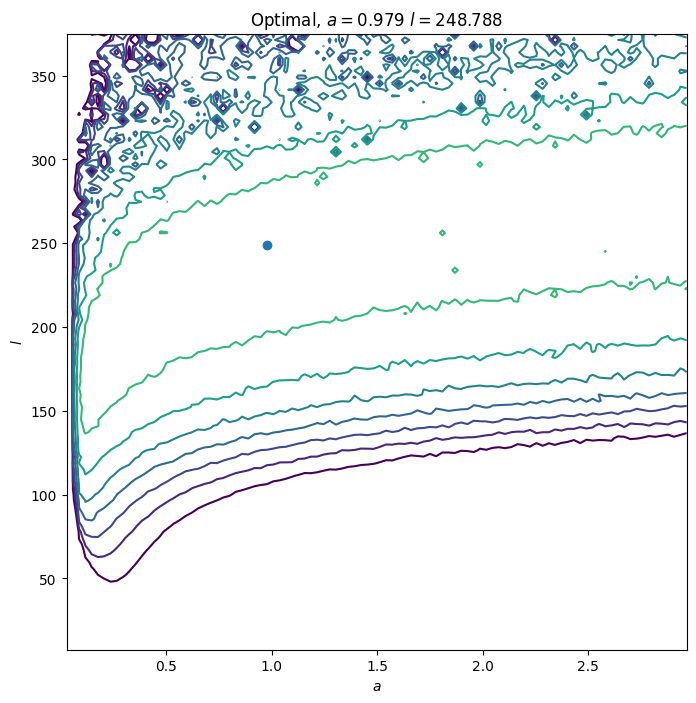

In [ ]:
plot_scan_results(p4_scan_products[0][0])

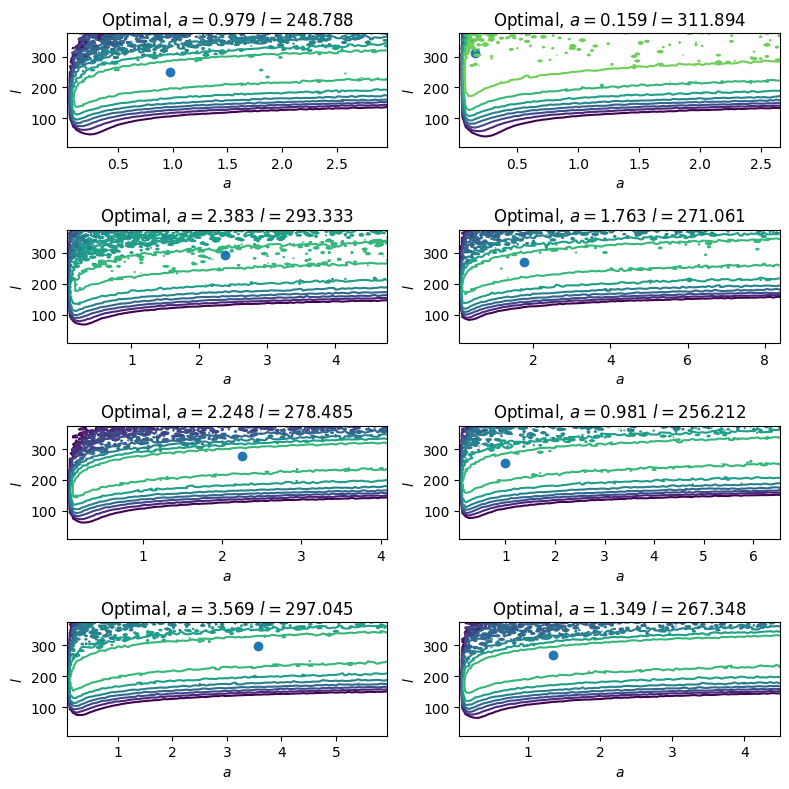

In [ ]:
for i, pos_results in enumerate(p4_scan_products):
  for j, comp_results in enumerate(pos_results):
    plt.subplot(len(p4_scan_products), 2, 1 + 2*i + j)
    plot_scan_results(comp_results)

plt.tight_layout()

### Running Gaussian Processes with sklearn

In [ ]:
def scikit_scan_position(loc, tau):
  a_scan = np.linspace(0.1, 10.0, 100)
  ell_scan = 75*np.linspace(0.1, 5.0, 100)

  for values in [ data[:, loc[0], loc[1], 0], data[:, loc[0], loc[1], 1] ]:
    values = values[::1]
    z_locations = grid_longT_edges[:-1:1]
    val_std = np.sqrt(np.square(values).mean())

    import sklearn.gaussian_process

    GPR = sklearn.gaussian_process.GaussianProcessRegressor(
        kernel = sklearn.gaussian_process.kernels.ConstantKernel(constant_value=val_std, constant_value_bounds=(val_std*0.1, val_std*10.0)) * sklearn.gaussian_process.kernels.RBF(length_scale=100.0, length_scale_bounds=(7.5, 375)),
        alpha = tau # this is basically tau
        ).fit(z_locations.reshape(-1, 1), values)

    result = np.exp(GPR.kernel_.theta)

    grid = []
    for a in a_scan:
      for ell in ell_scan:
        grid.append([a, ell, GPR.log_marginal_likelihood(np.log([a, ell]))])
    result_grids = np.array(grid).T

    #result, result_grids = scan(10, values, np.zeros_like(values), tau, scan_seq(z_locations, val_std*a_scan, ell_scan))
    yield result, result_grids

p4_d_scan_products = list(map(lambda p: list(scikit_scan_position(p, 0.001)), [
            [1400//3, 400//3],
            [400//3, 600//3],
            [500//3, 1400//3],
            [1200//3, 1200//3]
]))

/usr/local/lib/python3.10/dist-packages/sklearn/gaussian_process/_gpr.py:629: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL_TERMINATION_IN_LNSRCH.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  _check_optimize_result("lbfgs", opt_res)


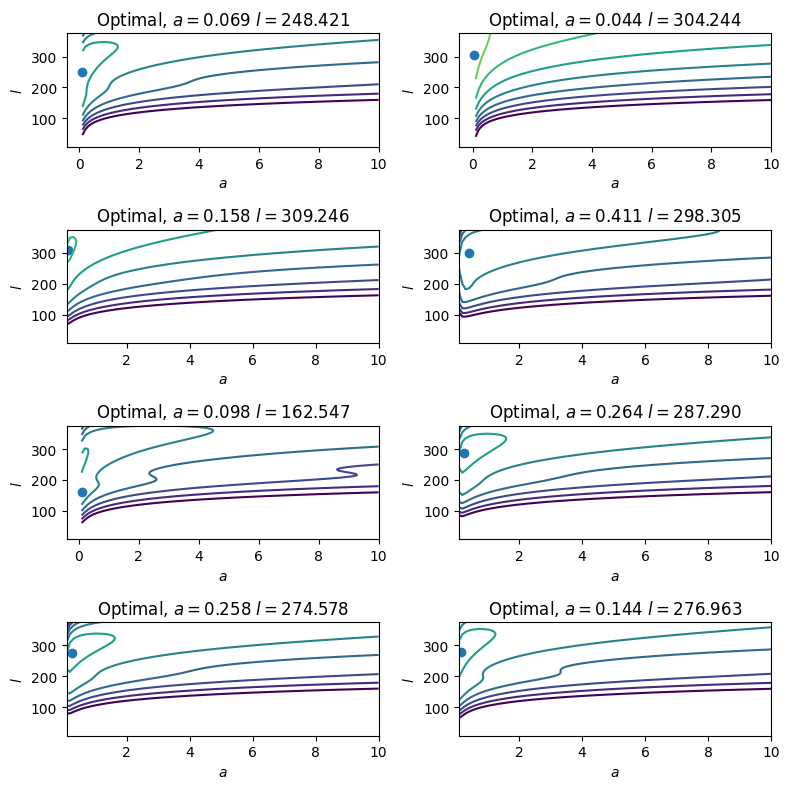

In [ ]:
for i, pos_results in enumerate(p4_d_scan_products):
  for j, comp_results in enumerate(pos_results):
    plt.subplot(len(p4_d_scan_products), 2, 1 + 2*i + j)
    plot_scan_results(comp_results, level_range=(0, 200))

plt.tight_layout()

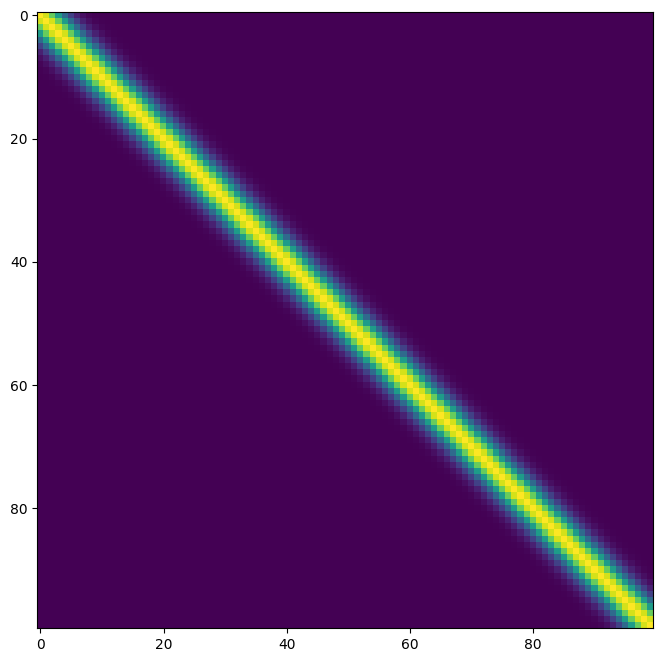

In [ ]:
p5_gen_cov_params = (2.5, 280.0)
p5_gen_cov = lambda z, w: generate_cov(z, w, *p5_gen_cov_params)
p5_cov = p5_gen_cov(grid_longT_edges[:-1], grid_longT_edges[:-1])
plt.imshow(p5_cov)

### Make Predictions

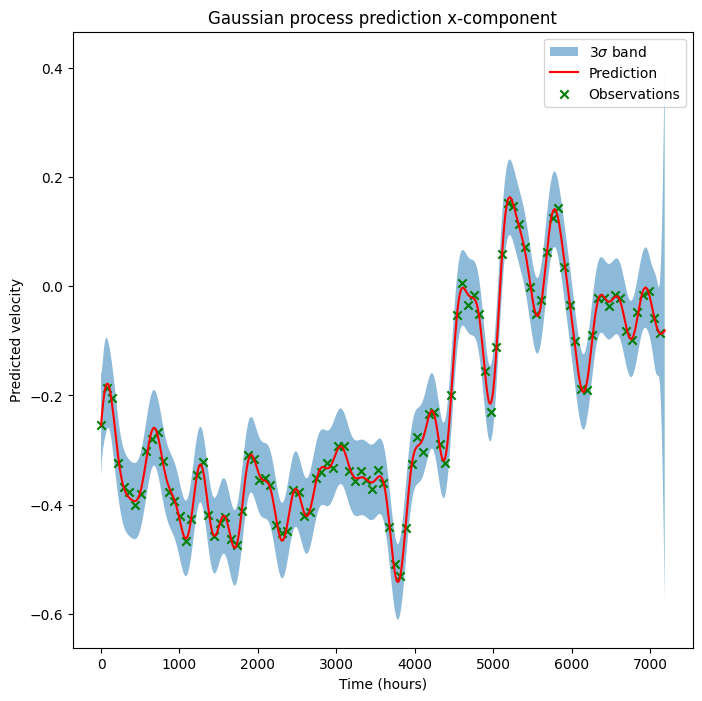

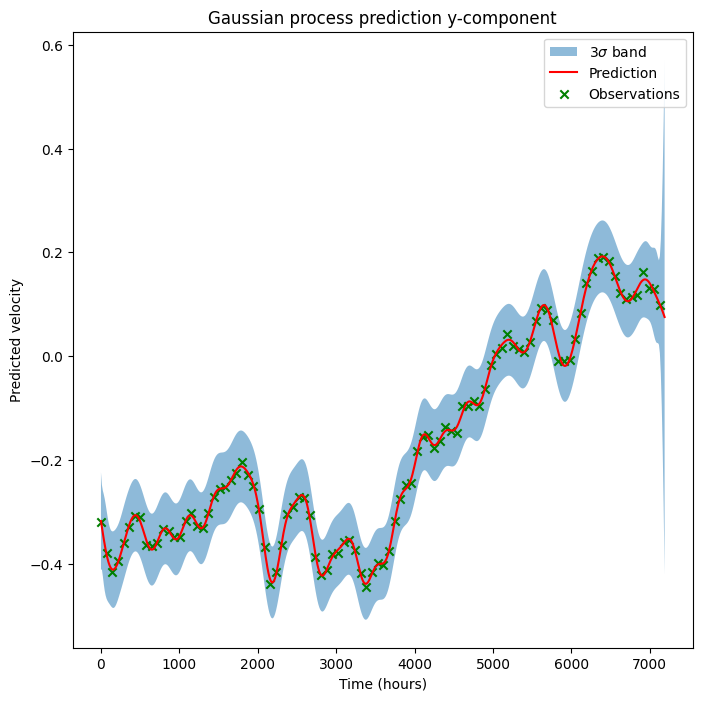

In [ ]:
def make_prediction(z, predicted_mean, gen_cov, obs, obs_means, obs_zs, obs_cov, tau):
  z = np.array([z])
  cov_blocks = [
               [ gen_cov(z, z), gen_cov(z, obs_zs) ],
               [ gen_cov(z, obs_zs), obs_cov ]
  ]
  pred_mean_cond, pred_var_cond = gaussian_process(np.array([predicted_mean]), obs_means, obs, cov_blocks, tau)
  return pred_mean_cond[0], pred_var_cond[0][0]



def plot_prediction(pred_zs, predicted_mean, gen_cov, obs, obs_means, obs_zs, tau, title):
  obs_cov = gen_cov(obs_zs, obs_zs)
  zs = np.sort(np.concatenate([pred_zs, obs_zs]))
  preds = map(lambda z: make_prediction(z, predicted_mean, gen_cov, obs, obs_means, obs_zs, obs_cov, tau), zs)
  pred_means, pred_vars = map(np.array, zip(*preds))

  plt.fill_between(zs, pred_means - 3*np.sqrt(pred_vars), pred_means + 3*np.sqrt(pred_vars), alpha=0.5, label=r"$3\sigma$ band")
  plt.plot(zs, pred_means, c='r', label="Prediction")
  plt.scatter(obs_zs, obs, c='g', marker='x', label="Observations")
  plt.title("Gaussian process prediction {}".format(title))
  plt.xlabel("Time (hours)")
  plt.ylabel("Predicted velocity")
  plt.legend()
  plt.show()

###

p5_obs_times = np.arange(0, 300, 3)*24.0 # hrs
p5_pred_times = np.array(list(set(np.arange(0, 300, 0.5))-set(p5_obs_times)))*(24.0) # hrs

###

for p5_obs, title in zip(data[:, 1400//3, 400//3].T, ["x-component", "y-component"]):
  p5_prior_means = p5_obs.mean()*np.ones_like(p5_obs)
  plot_prediction(p5_pred_times, p5_obs.mean(), p5_gen_cov, p5_obs, p5_prior_means, p5_obs_times, 0.001, title)

### Make Predictions with sklearn

In [ ]:
p5_obs_times = np.arange(0, 300, 3)*24.0 # hrs
p5_pred_times = np.array(list(set(np.arange(0, 300, 0.5))-set(p5_obs_times)))*(24.0) # hrs

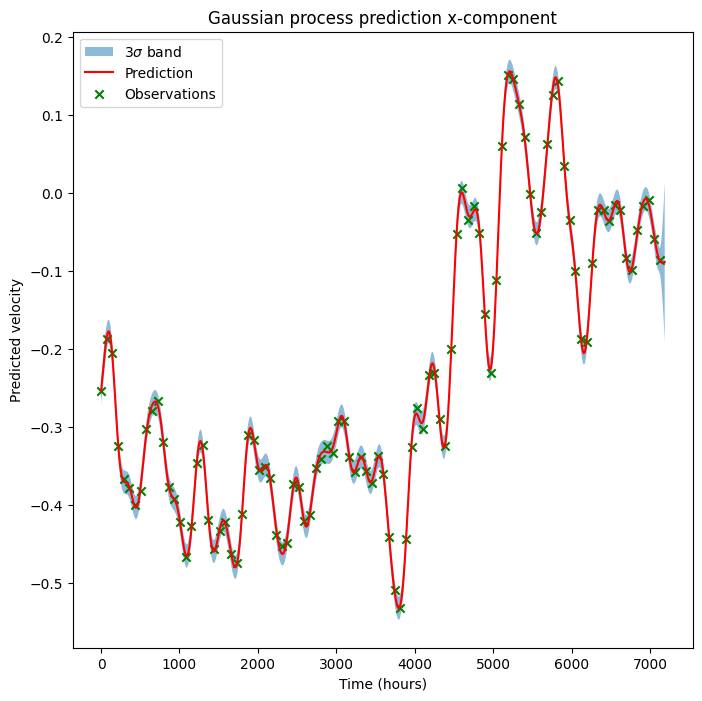

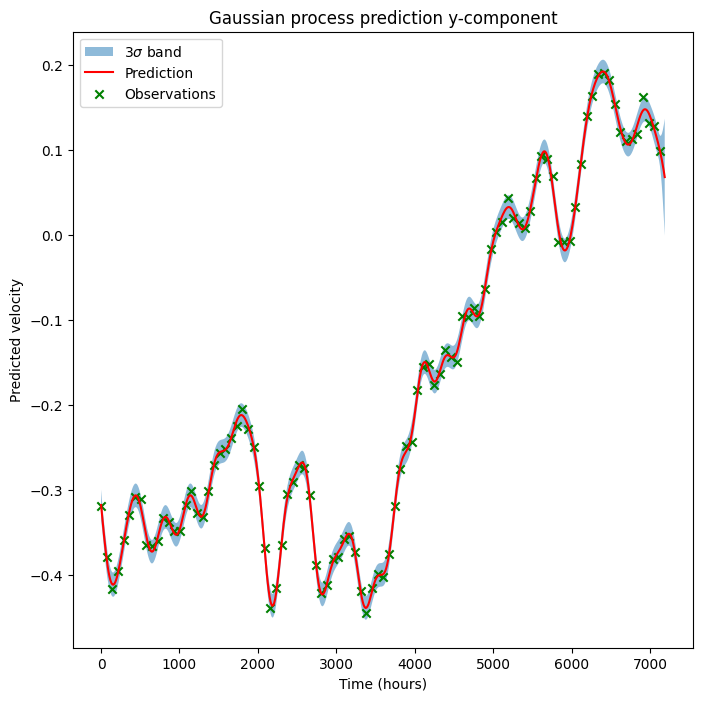

In [ ]:
def plot_prediction(pred_zs, obs, obs_zs, tau, title):
  zs = np.sort(np.concatenate([pred_zs, obs_zs]))

  import sklearn.gaussian_process
  GPR = sklearn.gaussian_process.GaussianProcessRegressor(
        kernel = sklearn.gaussian_process.kernels.ConstantKernel(constant_value=p5_gen_cov_params[0], constant_value_bounds=(0.01, 100.0)) * sklearn.gaussian_process.kernels.RBF(length_scale=100.0, length_scale_bounds=(7.5, 375)),
        alpha = tau, # this is basically tau
        normalize_y = True
        ).fit(obs_zs.reshape(-1, 1), obs)

  #preds = map(lambda z: make_prediction(z, predicted_mean, gen_cov, obs, obs_means, obs_zs, obs_cov, tau), zs)
  #pred_means, pred_vars = map(np.array, zip(*preds))
  pred_means, pred_stds = GPR.predict(zs.reshape(-1, 1), return_std=True)
  pred_vars = pred_stds**2

  plt.fill_between(zs, pred_means - 3*np.sqrt(pred_vars), pred_means + 3*np.sqrt(pred_vars), alpha=0.5, label=r"$3\sigma$ band")
  plt.plot(zs, pred_means, c='r', label="Prediction")
  plt.scatter(obs_zs, obs, c='g', marker='x', label="Observations")
  plt.title("Gaussian process prediction {}".format(title))
  plt.xlabel("Time (hours)")
  plt.ylabel("Predicted velocity")
  plt.legend()
  plt.show()

for p5_obs, title in zip(data[:, 1400//3, 400//3].T, ["x-component", "y-component"]):
  plot_prediction(p5_pred_times, p5_obs, p5_obs_times, 0.001, title)

## Simulation

In [ ]:
def jax_generate_cov(zs1, zs2, a, ell):
  return (a**2) * jnp.exp(-(zs1[:,None] - zs2[None, :])**2 / ell**2)

def jax_gaussian_process(x0_mean, x1_mean, x1, cov_blocks, tau):
  cov_11_noise = cov_blocks[1][1] + tau * jnp.eye(x1_mean.shape[0])

  x0_mean_cond1 = x0_mean + cov_blocks[0][1].dot( jax.numpy.linalg.solve(cov_11_noise, x1 - x1_mean ) )
  cov_00_cond2 = cov_blocks[0][0] - cov_blocks[0][1].dot(jax.numpy.linalg.solve(cov_11_noise, cov_blocks[0][1].T))

  return x0_mean_cond1, cov_00_cond2

def jax_make_prediction(z, predicted_mean, gen_cov, obs, obs_means, obs_zs, obs_cov, tau):
  z = jnp.array([z])
  cov_blocks = [
               [ gen_cov(z, z), gen_cov(z, obs_zs) ],
               [ gen_cov(z, obs_zs), obs_cov ]
  ]
  pred_mean_cond, pred_var_cond = jax_gaussian_process(jnp.array([predicted_mean]), obs_means, obs, cov_blocks, tau)
  return pred_mean_cond[0], pred_var_cond[0][0]

def jax_v_position(x, grid, g_x_edges, g_y_edges):
    clamp = lambda ar, min_, max_: jnp.maximum(min_, jnp.minimum(max_, ar))
    vi = clamp(jnp.searchsorted(g_x_edges, x[:,0]), 1, g_x_edges.shape[0]-1)
    vj = clamp(jnp.searchsorted(g_y_edges, x[:,1]), 1, g_y_edges.shape[0]-1)
    return grid[:, vi-1,vj-1,:].T

def get_v_func(gen_cov, t_grid, g_x_edges, g_y_edges, grid_cov, tau):

  def v_func(t, x, grid):
    obs = jax_v_position(x, grid, g_x_edges, g_y_edges)

    rfun = jax.vmap(lambda o: jax_make_prediction(t, o.mean(), gen_cov, o, jnp.ones_like(o)*o.mean(), t_grid, grid_cov, tau)[0])
    return rfun(obs.reshape((-1, obs.shape[2]))).reshape((2, obs.shape[1])).T
  return v_func

#@functools.partial(jax.jit, static_argnums=(0,1))
def jax_sim_gp(N, save_stride, t_edges, v_func, v_grid, x_0, epsilon):

  clamp = lambda ar, min_, max_: jnp.maximum(min_, jnp.minimum(max_, ar))

  def get_grid(t):
    vt = clamp(jnp.searchsorted(t_edges, t), 1, t_edges.shape[0]-1)
    return v_grid[vt-1]

  state_0 = (x_0, 0.0, v_func(0.0, x_0, v_grid), *get_grid(0.0).transpose([2,0,1]))

  def step(i, state):
    x, t, v, _, _ = state

    v_t_grid = get_grid(t)
    v = v_func(t, x, v_grid)

    x = x + epsilon*v # Compute the next position value
    t = t + epsilon # Compute the next time

    new_state = (x, t, v, v_t_grid[:,:,0], v_t_grid[:,:,1])
    return new_state

  def save_step(state, i):
    new_state = jax.lax.fori_loop(i, i+save_stride, step, state)
    return new_state, new_state

  _, states = jax.lax.scan(save_step, state_0, xs=jnp.arange(0, N, save_stride))
  return states

@functools.partial(jax.jit, static_argnums=(0,1))
def jax_gp(N, save_stride, t_edges, g_x_edges, g_y_edges, v_grid, x_0, epsilon, a, ell, tau):
  mid = lambda a: (a[1:] + a[:-1])/2
  t_grid, x_grid, y_grid = map(mid, (t_edges, g_x_edges, g_y_edges))
  gen_cov = lambda z, w: jax_generate_cov(z, w, a, ell)
  grid_cov = gen_cov(t_grid, t_grid)
  v_func = get_v_func(gen_cov, t_grid, g_x_edges, g_y_edges, grid_cov, tau)
  return jax_sim_gp(N, save_stride, t_edges, v_func, v_grid, x_0, epsilon)

In [ ]:
T = 24*300.0 #@param {type:"number"}
N = 4*T #@param {type:"integer"}
num = 1000 #@param {type:"integer"}
epsilon = T/N # hours

grid_t_edges = np.arange(0, data.shape[0]+1)*3*24 # 3 days per point
grid_x_edges = np.arange(0, data.shape[1]+1)*3 # 3km per point
grid_y_edges = np.arange(0, data.shape[2]+1)*3 # 3km per point

def plot_overlay(ax):
  ax.matshow(mask.T, extent=[0, grid_x_edges.max(), 0, grid_y_edges.max()])
  ax.axis([0, grid_x_edges.max(), 0, grid_y_edges.max()])

In [ ]:
for x_0_variance in [10**2, 50**2]:
  x_0 = np.random.multivariate_normal(mean=[300, 1050], cov=[[x_0_variance, 0], [0, x_0_variance]], size=num)

  p7_plane_states = jax_gp(N, N//100, grid_t_edges, grid_x_edges, grid_y_edges, data, x_0, epsilon, *p5_gen_cov_params+(0.001,))
  p7_plane_states_numpy = list(zip(*map(np.array, p7_plane_states)))
  p7_plane_animation = animate(p7_plane_states_numpy, grid_x, grid_y, "{}", overlay=plot_overlay, grid_stride=20, density=True)
  IPython.display.display(HTML(p7_plane_animation.to_html5_video()))

In [ ]:
x_0 = np.array([ np.random.rand(num)*grid_x_edges.max(), np.random.rand(num)*grid_y_edges.max() ]).T
x_0 = x_0[np.square(jax_v_position(x_0, data, grid_x_edges, grid_y_edges).T[0]).sum(axis=1) > 0]

midpoint = lambda ar: (ar[1:] + ar[:-1])/2
grid_x, grid_y = np.meshgrid(midpoint(grid_x_edges), midpoint(grid_y_edges), indexing='ij')
p5_states = jax_gp(N, N//100, grid_t_edges, grid_x_edges, grid_y_edges, data, x_0, epsilon, *p5_gen_cov_params+(0.001,))
p5_states_numpy = list(zip(*map(np.array, p5_states)))
p5_animation = animate(p5_states_numpy, grid_x, grid_y, "{}", overlay=plot_overlay, grid_stride=20, density=True)
from IPython.display import HTML
HTML(p5_animation.to_html5_video())